In [1]:
from deliveryRoutes import *
import os
import cmldask.CMLDask as da
import matplotlib.pyplot as plt
import pandas as pd
from dask.distributed import wait, as_completed, progress
from plotRoutes import *
from handleTSPRoutes import *

In [2]:
# set up pathing variables
rng = random.Random(123)
all_stores = store_pos_dict.keys()
num_trials = 80
num_deliveries = 15

In [6]:
# create distance matrix based on big graph of roads
import os
import math
import pickle
import numpy as np
import pandas as pd

DIST_CSV = "dist_mat2.csv"
PATH_PKL = "path_mat.pkl"

if os.path.exists(DIST_CSV):
    # ---- load cached ----
    dist_df = pd.read_csv(DIST_CSV, index_col=0)

    # NumPy view (ordering guaranteed by DataFrame)
    dist_mat = dist_df.to_numpy()

    # with open(PATH_PKL, "rb") as f:
    #     payload = pickle.load(f)
    #     path_mat = payload["path_mat"]
    #     store_names = payload["store_names"]

else:
    # ---- build constrained graph ----
    node_pos_dict = {**road_pos_dict, **store_pos_dict}

    node_adj_dict_bidir = make_bidirectional(node_adj_dict)
    adj = build_weighted_adj_from_topology(
        node_adj_dict_bidir, node_pos_dict, store_distance
    )

    store_names = all_stores
    S = len(store_names)

    dist_mat = np.full((S, S), math.inf, dtype=float)
    path_mat = [[None] * S for _ in range(S)]

    for i, src in enumerate(store_names):
        dist_to, path_to = dijkstra_paths_to_stores(adj, src, store_names)
        for j, tgt in enumerate(store_names):
            dist_mat[i, j] = dist_to[tgt]
            path_mat[i][j] = path_to[tgt]

    # ---- save labeled distances ----
    dist_df = pd.DataFrame(dist_mat, index=store_names, columns=store_names)
    dist_df.to_csv(DIST_CSV)

    # ---- save paths ----
    # with open(PATH_PKL, "wb") as f:
    #     pickle.dump(
    #         path_mat,
    #         f,
    #         protocol=pickle.HIGHEST_PROTOCOL,
    #     )


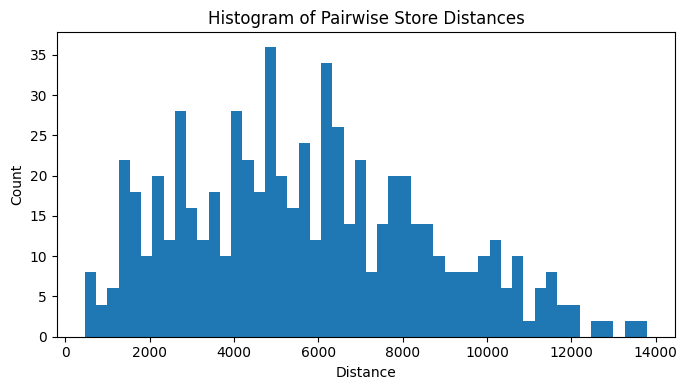

In [7]:
# plot distances to histogram to see appropriate radius
import numpy as np
import matplotlib.pyplot as plt

# dist_mat: numpy array (S x S)

# 1) Flatten
vals = dist_mat.ravel()

# 2) Remove invalid entries
vals = vals[np.isfinite(vals)]   # drop inf / nan
vals = vals[vals > 0]            # drop self-distances (0 on diagonal)

# 3) Plot
plt.figure(figsize=(7, 4))
plt.hist(vals, bins=50)
plt.xlabel("Distance")
plt.ylabel("Count")
plt.title("Histogram of Pairwise Store Distances")
plt.tight_layout()
plt.show()


# Radius-Based Pathing 
## (Greedily Choose From Nearest Neighbors)

In [7]:
radiusList = get_total_list_radius(all_stores, num_trials, num_deliveries, rng, dist_df=dist_df, radius=5000, k_nearest=10)

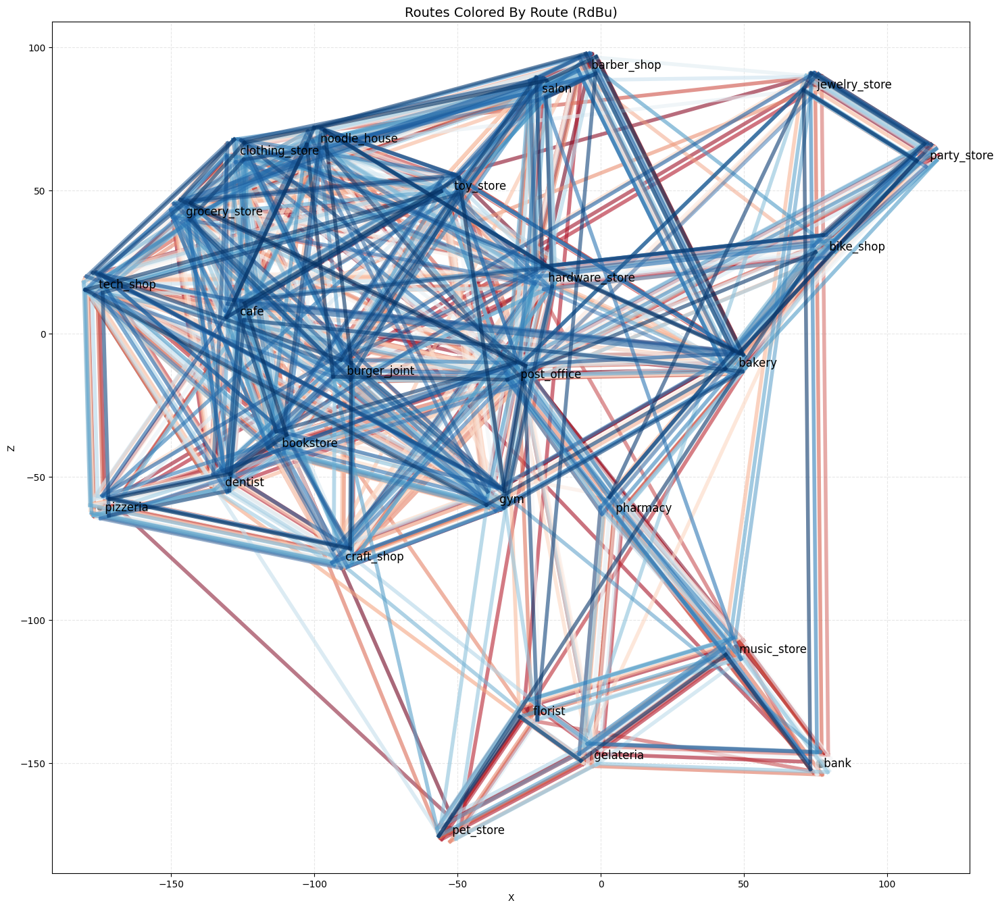

In [8]:
plot_routes_colored(radiusList, 
                    store_pos_dict, 
                    figsize=(15,15),
                    alpha_route= 0.7,
                    linewidth = 4.0,
                    jitter_scale=4.0,
                    jitter_seed = 8023453280,
                    alpha_jitter_scale = 0.25,
                    alpha_min=0.15,
                    alpha_max=0.6,
                    cmap_name="RdBu",
                   )

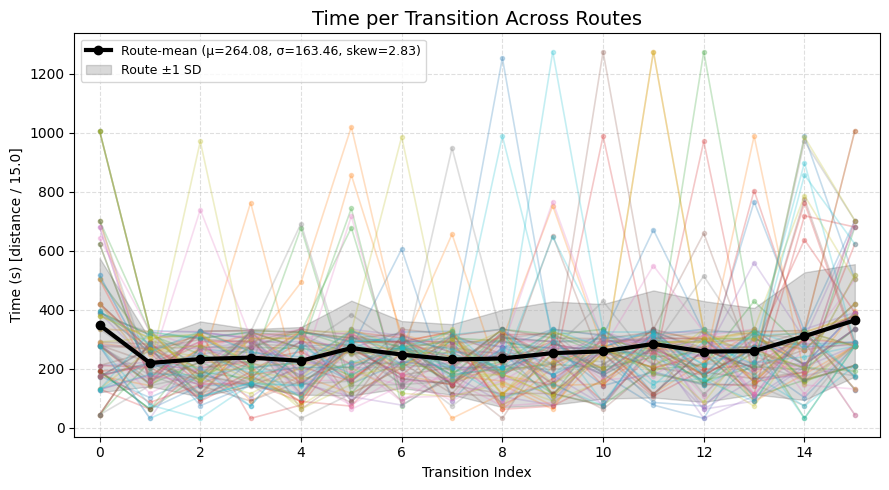

mean=264.07741584375
std=163.4573867103556


In [9]:
plot_dict_radius = plot_transition_times(
    radiusList,
    dist_df,
    player_speed = 15.0,
)

print(f"mean={plot_dict_radius['global_mean']}")
print(f"std={plot_dict_radius['global_std']}")

# Quadrant-Based Pathing 
## (Have Player Cycle Through Neighborhoods)

In [10]:
quadList = get_total_list_quad(all_stores, num_trials, num_deliveries, rng)

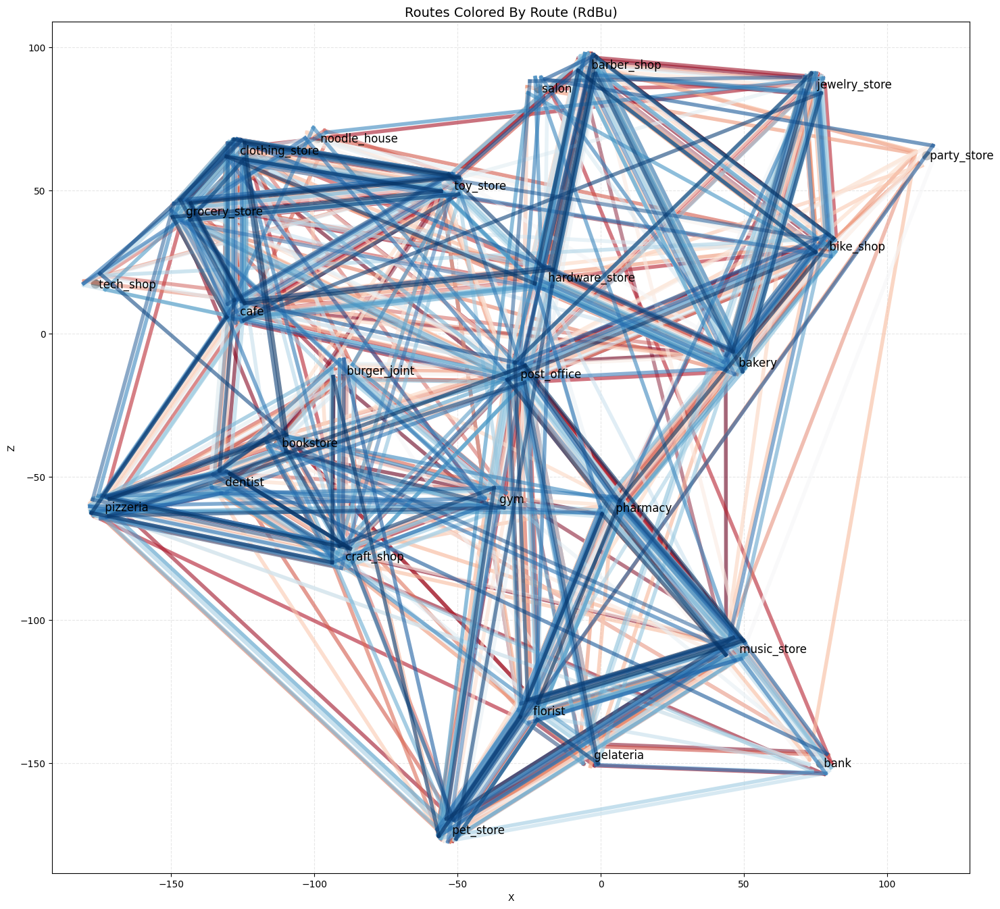

In [11]:
plot_routes_colored(quadList, 
                    store_pos_dict, 
                    figsize=(15,15),
                    alpha_route= 0.7,
                    linewidth = 4.0,
                    jitter_scale=4.0,
                    jitter_seed = 8023453280,
                    alpha_jitter_scale = 0.25,
                    alpha_min=0.15,
                    alpha_max=0.6,
                    cmap_name="Blues",
                   )

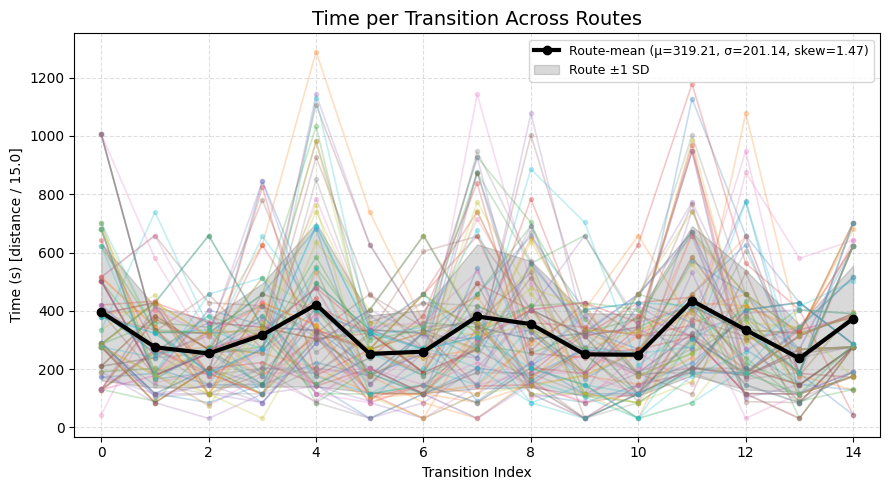

mean=319.21293215555556
std=201.14391466302425


In [14]:
plot_dict_quad = plot_transition_times(
    quadList,
    dist_df,
    player_speed = 15.0,
)
print(f"mean={plot_dict_quad['global_mean']}")
print(f"std={plot_dict_quad['global_std']}")

# Random-Pathing

In [15]:
pureList = [] 
for i in range(int(num_trials / 17)):
    pureList.extend(get_total_list_simple(all_stores, num_trials, num_deliveries, rng))


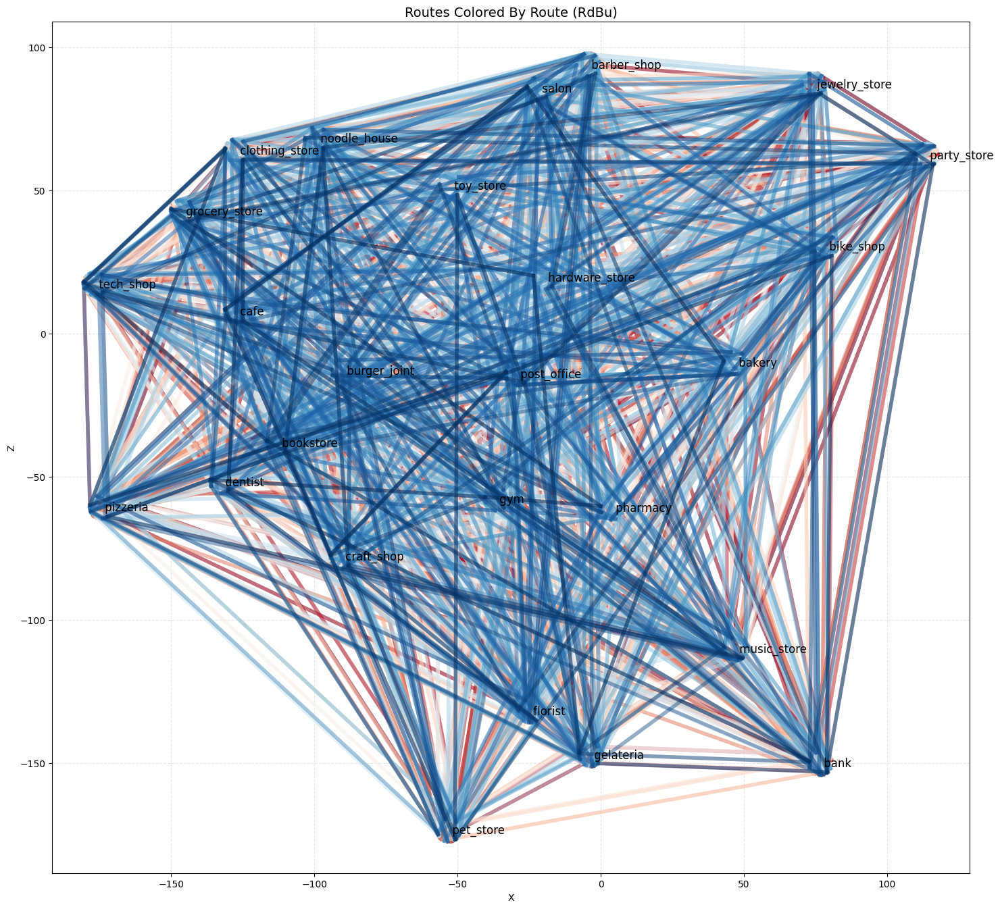

In [16]:
plot_routes_colored(pureList, 
                    store_pos_dict, 
                    figsize=(15,15),
                    alpha_route= 0.7,
                    linewidth = 4.0,
                    jitter_scale=4.0,
                    jitter_seed = 8023453280,
                    alpha_jitter_scale = 0.25,
                    alpha_min=0.15,
                    alpha_max=0.6,
                    cmap_name="Blues",
                   )

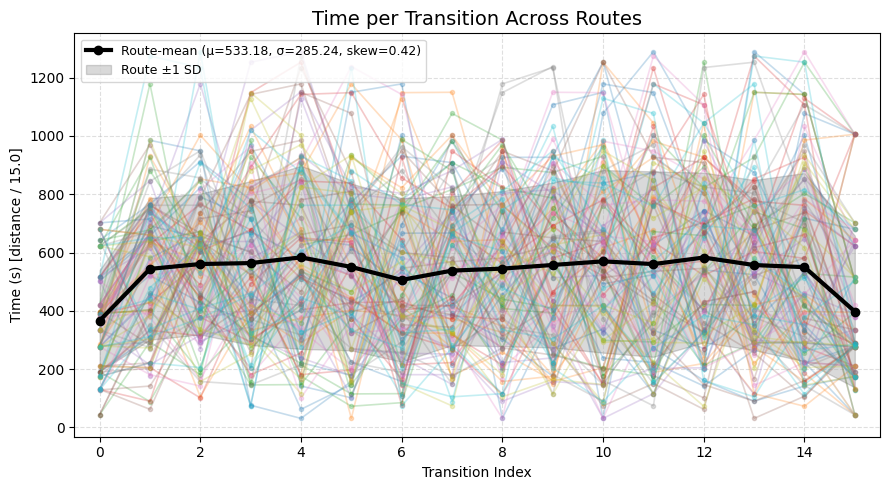

mean=533.1767475560897
std=285.2353929894819


In [18]:
plot_dict_pure = plot_transition_times(
    pureList,
    dist_df,
    player_speed = 15.0,
)
print(f"mean={plot_dict_pure['global_mean']}")
print(f"std={plot_dict_pure['global_std']}")

# TSP Pathing

In [3]:
logdir = os.path.join(os.path.abspath(os.curdir), 'dask_appendix_logs')
# first_run = False
dask_args = {'job_name': "deliverystore", 'memory_per_job': "36GB", 'max_n_jobs': 24,
             'log_directory': '~/ValueCourierAnalysis'}
os.makedirs(dask_args['log_directory'], exist_ok=True)
client = da.new_dask_client(**dask_args)
client.upload_file("deliveryRoutes.py")

Unique port for zrentala is 51618
{'dashboard_address': ':51618'}
To view the dashboard, run: 
`ssh -fN zrentala@rhino2.psych.upenn.edu -L 8000:192.168.86.142:51618` in your local computer's terminal (NOT rhino) 
and then navigate to localhost:8000 in your browser


{}

In [4]:
K = 15
N = 15
rng = random.Random(123)
stores_og = [s for s in store_pos_dict.keys() if s != "post_office"]

## Load Path Data From Cluster

In [6]:
combine_path_files("dijk_paths_fixed/tsp_dijk_fixed")

Combined 100 files into: dijk_paths_fixed/tsp_dijk_fixed_all.txt


In [24]:
# # tsp
# stores_sample_list = []
# adj_mats = []


# for i in range(1):
#     print(i)

#     include_list = rng.sample(store_names, k=K)  # store_names defines the global order

#     # build KxK matrix from your precomputed all-pairs distances
#     adj_mat_k, stores_k = subset_dist_matrix(dist_mat, store_names, include_list)

#     stores_sample_list.append(stores_k)
#     adj_mats.append(adj_mat_k)

#     line = run_tsp(adj_mat_k, stores_k, K)

#     with open("tsp_path_strict.txt", "a") as f:
#         f.write(line + "\n")


In [7]:
INFILE = "tsp_dijk_fixed_all.txt"
OUTFILE = "tsp_dijk_fixed_filt.txt"
parsed_routes = load_path_files(INFILE)
path_lists = [r["stores"] for r in parsed_routes]
print(parsed_routes[0]["path_str"], parsed_routes[0]["cost"], parsed_routes[0]["stores"])
# plot_routes_colored(path_lists, store_pos_dict, figsize=(15, 15))


florist, bank, craft_shop, dentist, clothing_store, grocery_store, cafe, burger_joint, noodle_house, barber_shop, pet_store, bike_shop, salon, pharmacy, gelateria 47232.0 ['florist', 'bank', 'craft_shop', 'dentist', 'clothing_store', 'grocery_store', 'cafe', 'burger_joint', 'noodle_house', 'barber_shop', 'pet_store', 'bike_shop', 'salon', 'pharmacy', 'gelateria']


In [43]:
# from deliveryRoutes import run_tsp_scoped
# futures = client.map(run_tsp_scoped, adj_mats, stores_sample_list, [K]*len(adj_mats))
# try:
#     results = client.gather(futures)

#     with open("tsp_path_strict_2.txt", "a") as f:
#         for line in results:
#             f.write(line + "\n")

#     print("Jobs completed successfully")
# except Exception:
#     print("Job failed with exception:")
#     raise

In [8]:
import pandas as pd

# load candidates (+ reverse)
candidates_pre_filt = []

for route_dict in parsed_routes:
    if route_dict:
        candidates_pre_filt.append(route_dict)
    
    stores = route_dict["stores"]
    rev_stores= stores[::-1]
    rev = f"{', '.join(rev_stores)}"
    
    if rev:
        candidates_pre_filt.append({"path_str": rev, "cost": route_dict["cost"], "stores": rev_stores})
    
    

print(f"Loaded {len(candidates_pre_filt)} candidates.")


Loaded 152600 candidates.


In [9]:
# filter candidates
L = max(len(c["stores"]) for c in candidates_pre_filt)   # fixed length
candidates = [c for c in candidates_pre_filt if c["stores"][0] in post_close_set and c["stores"][L - 1] in post_close_set]

In [10]:
print(f"Loaded {len(candidates)} candidates.")

Loaded 34794 candidates.


In [12]:
L = max(len(c["stores"]) for c in candidates)
min_dist = 12

constraint = HammingThresholdConstraintFast(
    seq_fn=lambda c: features_token_sequence(c, L=L),
    min_dist=min_dist
)

rows = []
constraint.prepare(candidates)  # IMPORTANT: do once
for i in range(len(candidates)):
    constraint.start(i)
    sel = [i]
    for j in range(len(candidates)):
        if j == i:
            continue
        if constraint.can_add(j):
            constraint.add(j)
            sel.append(j)

    rows.append({
        "start_idx": i,
        "start_path_str": candidates[i]["path_str"],
        "start_cost": candidates[i]["cost"],
        "n_valid": len(sel),
        "sum_cost": sum(candidates[k]["cost"] for k in sel),
    })

df_scores = pd.DataFrame(rows).sort_values(
    ["n_valid", "sum_cost"], ascending=[False, True]
).reset_index(drop=True)

print(df_scores.head(10))

   start_idx                                     start_path_str  start_cost  \
0       2156  tech_shop, noodle_house, clothing_store, groce...     41337.0   
1       2157  bookstore, burger_joint, gym, jewelry_store, s...     41337.0   
2      22652  gym, hardware_store, bakery, salon, party_stor...     31892.0   
3      22653  burger_joint, noodle_house, tech_shop, clothin...     31892.0   
4      14134  burger_joint, grocery_store, clothing_store, n...     35927.0   
5      14135  bookstore, pizzeria, craft_shop, bank, florist...     35927.0   
6       3010  burger_joint, noodle_house, toy_store, clothin...     45662.0   
7       3011  gym, hardware_store, pet_store, bakery, party_...     45662.0   
8       5148  cafe, dentist, grocery_store, bookstore, pizze...     39268.0   
9       5149  burger_joint, gym, hardware_store, salon, bake...     39268.0   

   n_valid   sum_cost  
0      140  6012298.0  
1      140  6012298.0  
2      140  6025831.0  
3      140  6025831.0  
4      139

In [15]:
highest_idx = df_scores.iloc[0]["start_idx"]
highest_idx

np.int64(2156)

In [17]:
L = max(len(c["stores"]) for c in candidates)
seq_fn = lambda c: features_token_sequence(c, L=L)

sel = greedy_pack_hamming(candidates, start_idx=highest_idx, seq_fn=seq_fn, min_dist=min_dist)
sel_paths = [candidates[i]["path_str"] for i in sel]
len(sel_paths)

140

In [18]:
with open(OUTFILE, "w") as f:
    for line in sel_paths:
        f.write(line + "\n")

In [50]:
# X = 10
# top_start_indices = df_scores["start_idx"].head(X).tolist()

# # Precompute incompat pairs ONCE (important)
# L = max(len(c["stores"]) for c in candidates)
# min_dist = 5
# incompat = incompat_pairs_from_hamming(
#     candidates,
#     seq_fn=lambda c: features_token_sequence(c, L=L),
#     min_dist=min_dist
# )

# rows_opt = []
# for rank, start_idx in enumerate(top_start_indices, start=1):
#     sel, stats = optimal_pack(candidates, incompat, must_include_idx=start_idx, time_limit_s=10000)
#     rows_opt.append({
#         "rank_greedy": rank,
#         "start_idx": start_idx,
#         "n_selected_opt": stats.get("n_selected", 0),
#         "sum_cost_opt": stats.get("sum_cost", float("inf")),
#         "status": stats.get("status"),
#         "wall_time_s": stats.get("wall_time_s"),
#     })

#     out_path = f"tsp_path_opt_startidx{start_idx}.txt"
#     with open(out_path, "w") as f:
#         for k in sel:
#             f.write(candidates[k]["path_str"] + "\n")

# df_opt = pd.DataFrame(rows_opt).sort_values(
#     ["n_selected_opt", "sum_cost_opt"], ascending=[False, True]
# )
# print(df_opt)


In [51]:
# ### GREEDILY CHECK BEST STARTING PATHS TO FIND VALID SETS OF PATHS
# import pandas as pd

# INFILE = "tsp_path_all.txt"

# def parse_line(line: str):
#     """
#     Returns dict with:
#       - path_str (original path part, stripped)
#       - cost (float)
#       - stores (list[str])
#       - transitions (set[tuple[str,str,str,str]])
#     or None if malformed.
#     """
#     line = line.strip()
#     if not line:
#         return None
#     try:
#         path_part, cost_part = line.rsplit(":", 1)
#     except ValueError:
#         return None

#     path_part = path_part.strip()
#     try:
#         cost = float(cost_part.strip())
#     except ValueError:
#         return None

#     stores = [s.strip() for s in path_part.split(",") if s.strip()]
#     if len(stores) < 4:
#         transitions = set()
#     else:
#         transitions = {
#             (stores[i], stores[i+1])
#             for i in range(len(stores) - 1)
#         }

#     return {
#         "path_str": path_part,
#         "cost": cost,
#         "stores": stores,
#         "transitions": transitions,
#     }


# def greedy_pack(candidates, start_idx: int):
#     """
#     Greedily builds a maximal (not guaranteed maximum) compatible set,
#     starting from candidates[start_idx], then scanning others in file order.
#     Compatibility constraint: no 4-gram transition tuple can repeat across paths.
#     Returns selected indices (list[int]) and the final transition_set.
#     """
#     transition_set = set()
#     selected = []

#     start = candidates[start_idx]
#     # Always include the start path (even if it has empty transitions)
#     transition_set |= start["transitions"]
#     selected.append(start_idx)

#     for j, cand in enumerate(candidates):
#         if j == start_idx:
#             continue
#         # skip if any transition overlaps
#         if cand["transitions"] and (cand["transitions"] & transition_set):
#             continue
#         transition_set |= cand["transitions"]
#         selected.append(j)

#     return selected, transition_set

# def reverse_path_line(line: str) -> str | None:
#     """
#     Reverse the store sequence in a 'path : cost' line.
#     Returns a new line suitable for parse_line(), or None if malformed.
#     """
#     line = line.strip()
#     if not line:
#         return None

#     try:
#         path_part, cost_part = line.rsplit(":", 1)
#     except ValueError:
#         return None

#     # Parse and reverse stores
#     stores = [s.strip() for s in path_part.split(",") if s.strip()]
#     if len(stores) < 2:
#         return None

#     stores_rev = stores[::-1]

#     # Reassemble line
#     path_rev = ", ".join(stores_rev)
#     return f"{path_rev} : {cost_part.strip()}"

# # ---- load all candidates once ----
# candidates = []
# with open(INFILE, "r") as f:
#     for line in f:
#         rec = parse_line(line)
#         rev_rec = parse_line(reverse_path_line(line))
#         if rec is not None:
#             candidates.append(rec)
#             candidates.append(rev_rec)

# print(f"Loaded {len(candidates)} valid candidate paths.")

# # ---- evaluate every possible starting path ----
# rows = []
# for i in range(len(candidates)):
#     sel, _ = greedy_pack(candidates, i)
#     rows.append({
#         "start_idx": i,
#         "start_path_str": candidates[i]["path_str"],
#         "start_cost": candidates[i]["cost"],
#         "n_valid": len(sel),
#         "sum_cost": sum(candidates[k]["cost"] for k in sel),  # optional
#     })

# df_scores = pd.DataFrame(rows).sort_values(
#     ["n_valid", "sum_cost"], ascending=[False, True]
# ).reset_index(drop=True)

# print(df_scores.head(10))


# # ---- choose top X starting paths ----
# X = 10  # <-- set this
# top = df_scores.head(X)

# # ---- rerun filtering and write outputs for each of the top X ----
# for rank, row in enumerate(top.itertuples(index=False), start=1):
#     start_idx = row.start_idx
#     sel, _ = greedy_pack(candidates, start_idx)

#     out_path = f"tsp_path_top{rank:02d}_startidx{start_idx}.txt"
#     with open(out_path, "w") as f_out:
#         for k in sel:
#             f_out.write(candidates[k]["path_str"] + "\n")

#     print(f"[rank {rank}] start_idx={start_idx} n_valid={len(sel)} -> wrote {out_path}")


In [19]:
tsp_list = []
min_dist = 12
with open(OUTFILE, "r") as f:
    for line in f:
        # path_part, cost_part = line.rsplit(":", 1)
        path_part = line
 

        # Strip whitespace/newlines around the whole path chunk
        path_part = path_part.strip()

        # Split on comma (not comma+space), then strip each token
        path = [tok.strip() for tok in path_part.split(",") if tok.strip()]

        # Add depot
        path.insert(0, "post_office")
        path.append("post_office")

        tsp_list.append(path)


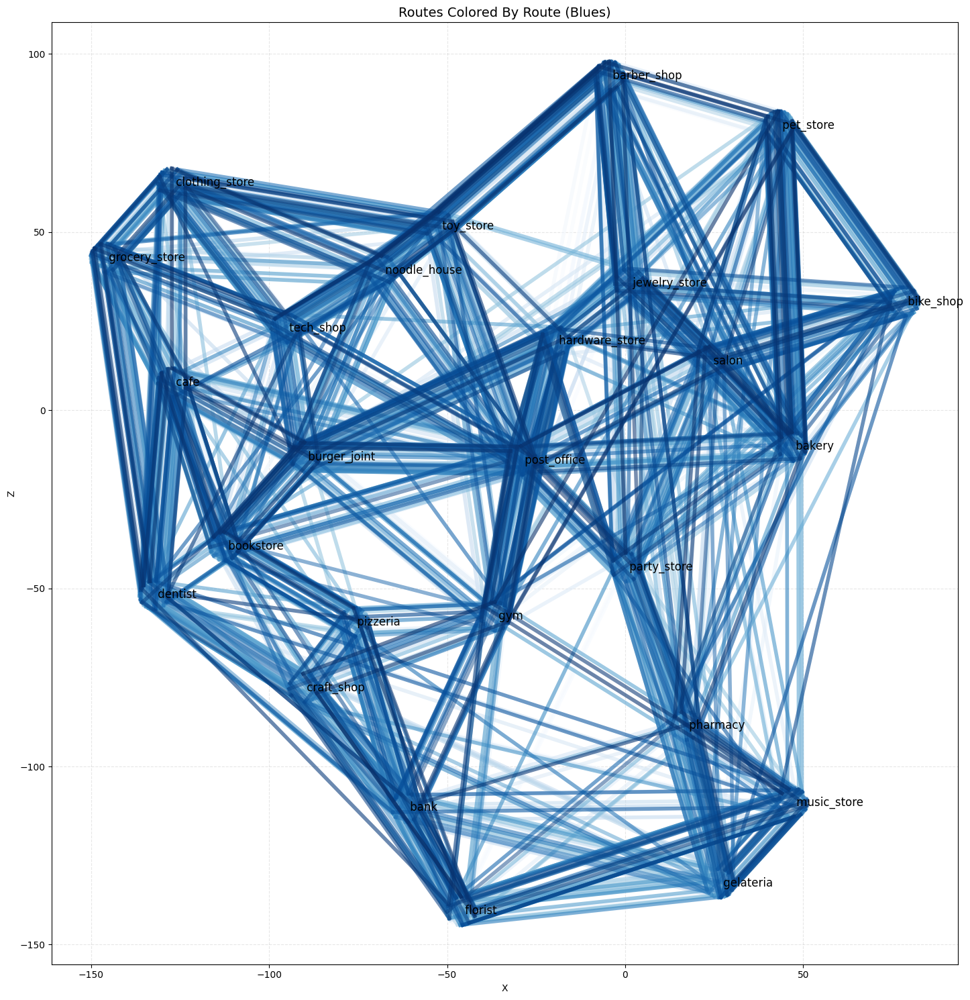

In [20]:
plot_routes_colored(tsp_list, 
                    store_pos_dict, 
                    figsize=(15,15),
                    alpha_route= 0.7,
                    linewidth = 4.0,
                    jitter_scale=4.0,
                    jitter_seed = 8023453280,
                    alpha_jitter_scale = 0.25,
                    alpha_min=0.15,
                    alpha_max=0.6,
                    cmap_name="Blues",
                   )

In [21]:
# mean_tsp, std_tsp, skew_tsp = plot_transition_times(
#     routes=tsp_list,
#     cmap_name = "tab10",
#     figsize=(9, 5),
#     title = "Distance per Transition Across Routes (TSP)",
#     show_mean=True,
#     show_std=True,
#     mean_color= "black",
# )
plot_dict_tsp = plot_transition_times(
    tsp_list,
    dist_df,
    player_speed = 15.0,
)

NameError: name 'dist_df' is not defined

In [ ]:
means = [plot_dict_pure["route_mean"], plot_dict_radius["route_mean"], plot_dict_quad["route_mean"], plot_dict_tsp["route_mean"]]
stds  = [plot_dict_pure["route_std"], plot_dict_radius["route_std"], plot_dict_quad["route_std"], plot_dict_tsp["route_std"]]
labels = ["Pure", "Radius-based", "Quadrant-based", "TSP"]

plot_algorithm_time_means(
    means,
    labels,
    stds=stds,
    player_speed=15.0,
    title="Mean Time per Transition by Routing Algorithm",
)